In [25]:
import torch
import numpy as np
import time
import matplotlib.pyplot as plt
import pickle
import sys
import torch.nn as nn
from iotools import hkdataset
from iotools.loader_factory import loader_factory
import itertools
import gc
import pandas as pd 

In [19]:
# CRinGeNet --Karan K optimized version, 30 nodes
class CRinGeNet(torch.nn.Module) :
    def __init__(self) :
        super(CRinGeNet, self).__init__()

        self._mlp_pid = torch.nn.Sequential(
#            torch.nn.BatchNorm1d(3),
            torch.nn.Linear(3,30), torch.nn.ReLU(),
            torch.nn.Linear(30,30), torch.nn.ReLU()
        )

        self._mlp_pos = torch.nn.Sequential(
            torch.nn.BatchNorm1d(3),
            torch.nn.Linear(3,30), torch.nn.ReLU(),
            torch.nn.Linear(30,30), torch.nn.ReLU()
        )

        self._mlp_dir = torch.nn.Sequential(
            torch.nn.BatchNorm1d(3),
            torch.nn.Linear(3,30), torch.nn.ReLU(),
            torch.nn.Linear(30,30), torch.nn.ReLU()
        )

        self._mlp_E = torch.nn.Sequential(
            torch.nn.BatchNorm1d(1),
            torch.nn.Linear(1,30), torch.nn.ReLU(),
            torch.nn.Linear(30,30), torch.nn.ReLU()
        )

        self._mlp = torch.nn.Sequential(
            torch.nn.Linear(120, 1024), torch.nn.ReLU(),
            torch.nn.Linear(1024, 1024), torch.nn.ReLU(),
            torch.nn.Linear(1024, 14784), torch.nn.ReLU()
        )


        self._upconvs = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(64, 64, 4, 2),  torch.nn.ReLU(),  # 24 x 44 
            torch.nn.Conv2d(64, 64, 3), torch.nn.ReLU(),               # 22 x 42 
                                                                                 
            torch.nn.ConvTranspose2d(64, 32, 4, 2), torch.nn.ReLU(),   # 46 x 86 
            torch.nn.Conv2d(32, 32, 3),  torch.nn.ReLU(),              # 44 x 84 
                                                                                
            torch.nn.ConvTranspose2d(32, 32, 4, 2), torch.nn.ReLU(),   # 90 x 170
            torch.nn.Conv2d(32, 3, 3)                                  # 88 x 168
        )

        self._sigmoid = torch.nn.Sigmoid()

    def forward(self, x) :
        # Concatenate MLPs that treat PID, pos, dir and energy inputs separately
        net = torch.cat( (self._mlp_pid(x[:,0:3]),self._mlp_pos(x[:,3:6]),self._mlp_dir(x[:,6:9]),self._mlp_E(x[:,9].reshape(len(x[:,9]),1))), 1)

        # MegaMLP 
        net = self._mlp(net)
        
        # Reshape into 11 x 21 figure in 64 channels. Enough?!
        net = net.view(-1, 64, 11, 21)

        # 
        net = self._upconvs(net).view(-1, 3, 88*168)
        return net

    class BLOB :
    pass
blob = BLOB()
blob.net = CRinGeNet().cuda()

#blob.bceloss = torch.nn.BCELoss(reduction = 'sum')
blob.bceloss = torch.nn.BCEWithLogitsLoss()

#blob.criterion = torch.nn.SmoothL1Loss()
# Clip gradient norm to avoid exploding gradients:
torch.nn.utils.clip_grad.clip_grad_norm_(blob.net.parameters(), 1.0)
blob.optimizer = torch.optim.Adam(blob.net.parameters(), lr = 0.0002)
blob.data = None
blob.label = None

## set precision to 10

In [3]:
torch.set_printoptions(precision=10)

### Note:  using my local file. please change the file directory 
display one sample img

In [5]:
import h5py
fe = h5py.File('newdata/IWCDgrid_varyAll_e-_20-2000MeV_1M.h5', mode='r')

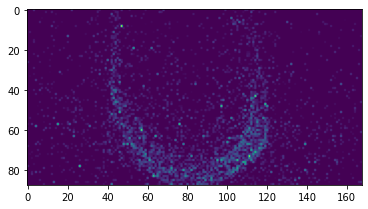

In [6]:
plt.imshow(fe['event_data'][73184 ][:,:,0])#821.8012

## display true images for 18 selected Events --see indicies in the lable_id

In [7]:
list=[]
data=[]

label_id=[39680 ,32640,8197,73502,3968,16250,10122,73510,3813,6041,58898,72889,5,2854,3433,7616,8511,10076]
label=[]
for i in label_id:    
        print(i, fe['energies'][i],fe['positions'][i],fe['directions'][i] )
        info=np.hstack(([0,1,0],fe['positions'][i][0],fe['directions'][i][0],fe['energies'][i]))
        list.append(fe['event_data'][i])
        data.append(info)#10-dim vector [pid,pos,dir,en]
        imgs=fe['event_data'][i]
        label.append(imgs)        

39680 [100.76168] [[ 105.29884 -177.57666  -89.01524]] [[-0.4195991   0.12949905  0.8984245 ]]
32640 [160.30194] [[ 152.09717 -154.30336 -159.25754]] [[-0.38014928  0.20424426  0.90209246]]
8197 [287.97617] [[ 100.03612 -321.8034   -97.64141]] [[0.35394785 0.32985553 0.8751664 ]]
73502 [262.59003] [[ 129.02579 -415.28802 -132.98569]] [[-0.88655597  0.4511077   0.10256898]]
3968 [495.43713] [[  52.589504 -132.25769  -208.85336 ]] [[-0.96388805  0.01930903  0.26560688]]
16250 [432.0267] [[ 148.24092 -369.8241   -92.20234]] [[0.5888193  0.53240526 0.6081418 ]]
10122 [407.01184] [[ 200.99461 -267.40353 -141.20499]] [[-0.2698374   0.56284815  0.78127444]]
73510 [867.53796] [[ 176.54124  -338.83273  -119.228035]] [[0.06115925 0.5279039  0.8470992 ]]
3813 [836.20526] [[ 213.11307  -212.80157  -113.067505]] [[-0.44722396  0.35815352  0.8195833 ]]
6041 [808.62024] [[ 121.89052 -167.5937  -132.39423]] [[-0.40739867  0.35282153  0.8423439 ]]
58898 [844.7528] [[ 116.082344 -271.99503  -183.99838 ]

In [8]:
data[12]

array([ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,  1.90586716e+02,
       -2.64998749e+02, -1.03426186e+02, -8.63385558e-01,  3.76557648e-01,
        3.35812092e-01,  1.83964575e+03])

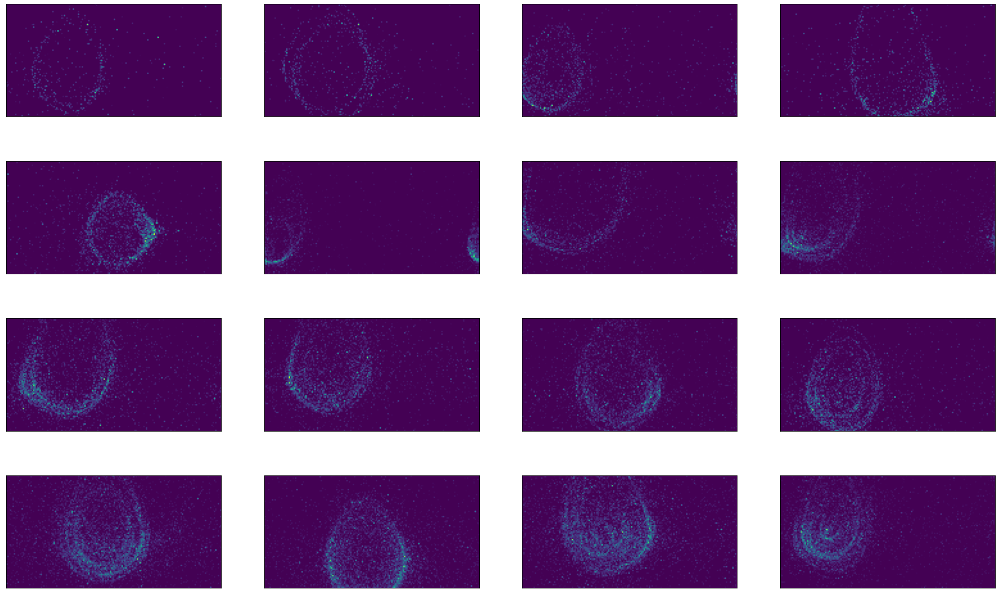

<Figure size 432x288 with 0 Axes>

In [67]:
#plot 16 images
def plotimg(list,grid_size,savefigname):
    #grid_size = 10
    fig, ax = plt.subplots(grid_size, grid_size, figsize = (32, 20))
    for i, j in itertools.product(range(grid_size), range(grid_size)):
        ax[i, j].get_xaxis().set_visible(False)
        ax[i, j].get_yaxis().set_visible(False)
    for k in range(grid_size * grid_size):
        i = k // grid_size
        j = k % grid_size
        ax[i, j].cla()
    #ax[i, j].imshow(test_images[k, 0].cpu().data.numpy(), cmap = 'gray')
        ax[i, j].imshow(list[k][:,:,0])#.cpu().data.numpy())
        
    plt.show()
    plt.savefig(savefigname)
    
plotimg(list,4,'fig_16')

In [ ]:
plt.savefig("CRinGeEvent_18.png")

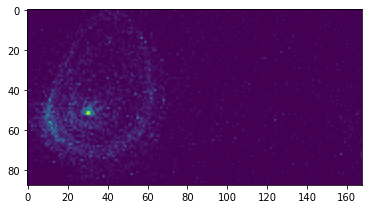

In [10]:
#display last 2 images inside the list
plt.imshow(fe['event_data'][8511][:,:,0])

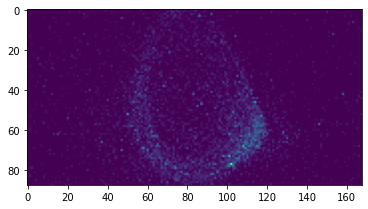

In [11]:
plt.imshow(fe['event_data'][10076 ][:,:,0])

## load model weights file 

In [12]:
import torch
import matplotlib.pyplot as plt
import sys
net = CRinGeNet().cpu()
#testCRinGe_Gaus_i_29451.0.cnn
#net.load_state_dict(torch.load("24testCRinGe_Gaus_i_20999.0.cnn", map_location=lambda storage, loc: storage))
net.load_state_dict(torch.load("testCRinGe_Gaus.cnn", map_location=lambda storage, loc: storage))

torch.set_grad_enabled(False)
net.eval()

CRinGeNet(
  (_mlp_pid): Sequential(
    (0): Linear(in_features=3, out_features=30, bias=True)
    (1): ReLU()
    (2): Linear(in_features=30, out_features=30, bias=True)
    (3): ReLU()
  )
  (_mlp_pos): Sequential(
    (0): BatchNorm1d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): Linear(in_features=3, out_features=30, bias=True)
    (2): ReLU()
    (3): Linear(in_features=30, out_features=30, bias=True)
    (4): ReLU()
  )
  (_mlp_dir): Sequential(
    (0): BatchNorm1d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): Linear(in_features=3, out_features=30, bias=True)
    (2): ReLU()
    (3): Linear(in_features=30, out_features=30, bias=True)
    (4): ReLU()
  )
  (_mlp_E): Sequential(
    (0): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): Linear(in_features=1, out_features=30, bias=True)
    (2): ReLU()
    (3): Linear(in_features=30, out_features=30, bias=True)
    (4): ReLU()
  )
  (

In [68]:
#plot predictions -3 channels
def _plot(pred,idx):
    fig = plt.figure(figsize = (34, 20))
    a = fig.add_subplot(1, 4, 1)
    imgplot = plt.imshow(pred[0,0].reshape(88,168).cpu().detach().numpy())
    a.set_title('logvar')

    a = fig.add_subplot(1, 4, 2)
    imgplot = plt.imshow(pred[0,1].reshape(88,168).cpu().detach().numpy())
    a.set_title('logmu')

    a = fig.add_subplot(1, 4, 3)
    imgplot = plt.imshow(pred[0,2].reshape(88,168).cpu().detach().numpy())
    a.set_title('punhit')
    a = fig.add_subplot(1, 4, 4)
    imgplot = plt.imshow(fe['event_data'][idx][:,:,0])
    a.set_title('Original')
   

def _loss(prediction, label):
    label = torch.as_tensor(label).type(torch.FloatTensor).cuda()
    logvar = torch.as_tensor(prediction[0,0].reshape(88,168).cpu().detach().numpy()).type(torch.FloatTensor).cuda()
    logmu = torch.as_tensor(prediction[0,1].reshape(88,168).cpu().detach().numpy()).type(torch.FloatTensor).cuda()
    punhit = torch.as_tensor(prediction[0,2].reshape(88,168).cpu().detach().numpy()).type(torch.FloatTensor).cuda()
    var = torch.exp(logvar)
    mu = torch.exp(logmu)
    unhitMask = (label == 0)

    unhitTarget = torch.as_tensor(unhitMask).type(torch.FloatTensor).cuda()
    fracUnhit = unhitTarget.sum()/unhitTarget.numel()
            
    loss = fracUnhit*blob.bceloss(punhit, unhitTarget)

    loss += (1-fracUnhit)*(1/2.)*(logvar[~unhitMask] + (label[~unhitMask]-mu[~unhitMask])**2/var[~unhitMask]).mean()
    loss += (1-fracUnhit)*(1/2.)*np.log(2*np.pi)
    return loss   

In [69]:
def scan_loss(data,label,label_id):
    Loss=[]
    energy=[]
    j=0
    data=np.expand_dims(data, axis=0).tolist()
    origE=data[0][9]
    data = torch.as_tensor(data).cpu()        
    orig_pred = net(data)
    orig_loss=_loss(orig_pred, label[:,:,0]).cpu().detach().numpy()

    real=int(data[0][9])
    for i in range(real-60,real+60):    
        data[0][9]=float(i)
        data = torch.as_tensor(data).cpu()
        prediction = net(data)
        
        loss=_loss(prediction, label[:,:,0]).cpu().detach().numpy()
        Loss.append(loss)
        energy.append(i)
    
        print(j,"--Energy: ", data[0][9].cpu().detach().numpy(), '--loss: ', _loss(prediction, label[:,:,0]).cpu().detach().numpy())
        j=j+1
    
    print("min loss : ", np.amin(Loss),) #min function to get the min loss 
    print('--Original Loss :',orig_loss)
    result = np.where(Loss == np.amin(Loss))
   
    minIdx=result[0][0]
    print('Index of min loss :', minIdx)
    print('Energy value (min loss) :', energy[minIdx], ' --Original Energy :', origE )
    
    data[0][9]=energy[minIdx]
    data = torch.as_tensor(data).cpu()
    minPred=net(data)
    
    _plot(orig_pred,label_id)
    print('confirm min loss: ',_loss(minPred, label[:,:,0]).cpu().detach().numpy()) #confirm the min loss using the index 
    _plot(minPred,label_id)

In [70]:
def scan_loss_return(data,label,label_id):
    Loss=[]
    energy=[]
    j=0
    data=np.expand_dims(data, axis=0).tolist()
    origE=data[0][9]
    data = torch.as_tensor(data).cpu()        
    orig_pred = net(data)
    orig_loss=_loss(orig_pred, label[:,:,0]).cpu().detach().numpy()

    #real=int(data[0][9])
    lowerbound=data[0][9]*(0.8) # origE*0.8
    upperbound=data[0][9]*(1.2) #
    step_size=(upperbound-lowerbound)/100
    energyList=[]
    for i in range(100+1):
        E=lowerbound
        E=E+step_size*i
        energyList.append(E)  
    for i in energyList:    
        data[0][9]=i
        data = torch.as_tensor(data).cpu()
        prediction = net(data)
        
        loss=_loss(prediction, label[:,:,0]).cpu().detach().numpy()
        Loss.append(loss)
        energy.append(i)    
        j=j+1
       
    result = np.where(Loss == np.amin(Loss))
   
    minIdx=result[0][0]    
    
    data[0][9]=energy[minIdx]
    data = torch.as_tensor(data).cpu()
    minPred=net(data)
    minloss=_loss(minPred, label[:,:,0]).cpu().detach().numpy()
    
    print('confirm min loss: ',minloss) #confirm the min loss using the index 
    
    return minloss, orig_loss,origE,energy[minIdx].cpu().detach().numpy()

In [71]:
i=0
minloss, orig_loss,origE,energy_min=scan_loss_return(data[i],label[i],label_id[i])

confirm min loss:  0.17965615


In [72]:
minloss, orig_loss,origE,energy_min

(array(0.17965615, dtype=float32),
 array(0.17998867, dtype=float32),
 100.76168060302734,
 array(88.267235, dtype=float32))

In [73]:
true_loss=[]
min_loss=[]
true_E=[]
min_E=[]
for i in range(18):
    minloss, orig_loss,origE,energy_min=scan_loss_return(data[i],label[i],label_id[i])
   
    true_loss.append(orig_loss)
    min_loss.append(minloss)
    true_E.append(origE)
    min_E.append(energy_min)

confirm min loss:  0.17965615
confirm min loss:  0.27727008
confirm min loss:  0.34597585
confirm min loss:  0.30538765
confirm min loss:  0.46412396
confirm min loss:  0.37223205
confirm min loss:  0.4595678
confirm min loss:  0.6502314
confirm min loss:  0.699944
confirm min loss:  0.6865634
confirm min loss:  0.72699684
confirm min loss:  0.6051658
confirm min loss:  1.0840247
confirm min loss:  0.91913295
confirm min loss:  1.0866846
confirm min loss:  0.91745925
confirm min loss:  0.8827504
confirm min loss:  0.9003901


In [74]:
dict0 = {'index':label_id, 'true_E':true_E,'true_loss':true_loss,'min_E':min_E,'min_loss':min_loss}
    
df0 = pd.DataFrame(dict0) 
df0['true_loss']=df0['true_loss'].astype(float)
df0['min_loss']=df0['min_loss'].astype(float)
df0 


,index,true_E,true_loss,min_E,min_loss
0,39680,100.761681,0.179989,88.267235,0.179656
1,32640,160.301941,0.277402,150.04263,0.277270
2,8197,287.976166,0.346478,260.33044,0.345976
3,73502,262.590027,0.306299,225.82742,0.305388
4,3968,495.437134,0.464617,453.82043,0.464124
5,16250,432.026703,0.372852,395.73648,0.372232
6,10122,407.011841,0.459568,407.01184,0.459568
7,73510,867.537964,0.650494,829.36633,0.650231
8,3813,836.205261,0.700222,792.7226,0.699944
9,6041,808.620239,0.686581,795.6823,0.686563


In [75]:
df0_sorted=df0.sort_values('true_E')
df0_sorted

,index,true_E,true_loss,min_E,min_loss
0,39680,100.761681,0.179989,88.267235,0.179656
1,32640,160.301941,0.277402,150.04263,0.277270
3,73502,262.590027,0.306299,225.82742,0.305388
2,8197,287.976166,0.346478,260.33044,0.345976
6,10122,407.011841,0.459568,407.01184,0.459568
5,16250,432.026703,0.372852,395.73648,0.372232
4,3968,495.437134,0.464617,453.82043,0.464124
11,72889,690.274475,0.605620,646.0969,0.605166
9,6041,808.620239,0.686581,795.6823,0.686563
8,3813,836.205261,0.700222,792.7226,0.699944


In [76]:
df0.to_csv('select18_Loss.csv', index=False)

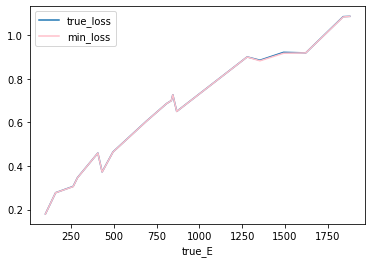

In [77]:
ax = plt.gca()

df0_sorted.plot(kind='line',x='true_E',y='true_loss',ax=ax)
df0_sorted.plot(kind='line',x='true_E',y='min_loss', color='pink', ax=ax)
#df_sorted.plot(kind='line',x='min_E',y='min_loss', color='red', ax=ax)
plt.show()

C:\Users\april\Anaconda3\envs\p36workshop\lib\site-packages\pandas\plotting\_matplotlib\core.py:1235: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticklabels)


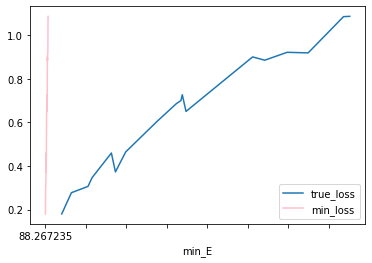

In [78]:
ax = plt.gca()

df0_sorted.plot(kind='line',x='true_E',y='true_loss',ax=ax)
df0_sorted.plot(kind='line',x='min_E',y='min_loss', color='pink', ax=ax)
#df_sorted.plot(kind='line',x='min_E',y='min_loss', color='red', ax=ax)
plt.show()

# Details and reconstructed imags for selected 18 events

In [79]:
def reconstr_plot(pred,idx):
    fig = plt.figure(figsize = (34, 20))
    a = fig.add_subplot(1, 4, 1)
    imgplot = plt.imshow(pred[0,0].reshape(88,168).cpu().detach().numpy())
    a.set_title('min_logvar')

    a = fig.add_subplot(1, 4, 2)
    imgplot = plt.imshow(pred[0,1].reshape(88,168).cpu().detach().numpy())
    a.set_title('min_logmu')

    a = fig.add_subplot(1, 4, 3)
    imgplot = plt.imshow(pred[0,2].reshape(88,168).cpu().detach().numpy())
    a.set_title('min_punhit')
    a = fig.add_subplot(1, 4, 4)
    imgplot = plt.imshow(fe['event_data'][idx][:,:,0])
    a.set_title('Original')
  

def min_scan_loss(data,label,label_id):
    Loss=[]
    energy=[]
    j=0
    data=np.expand_dims(data, axis=0).tolist()
    origE=data[0][9]
    data = torch.as_tensor(data).cpu()        
    orig_pred = net(data)
    orig_loss=_loss(orig_pred, label[:,:,0]).cpu().detach().numpy()

    real=int(data[0][9])
    for i in energyList:    
        data[0][9]=i
        data = torch.as_tensor(data).cpu()
        prediction = net(data)
        
        loss=_loss(prediction, label[:,:,0]).cpu().detach().numpy()
        Loss.append(loss)
        energy.append(i)
    
        print(j,"--Energy: ", data[0][9].cpu().detach().numpy(), '--loss: ', _loss(prediction, label[:,:,0]).cpu().detach().numpy())
        j=j+1
    
    print("min loss : ", np.amin(Loss),) #min function to get the min loss 
    print('--Original Loss :',orig_loss)
    result = np.where(Loss == np.amin(Loss))
   
    minIdx=result[0][0]
    print('Index of min loss :', minIdx)
    print('Energy value (min loss) :', energy[minIdx], ' --Original Energy :', origE )
    
    data[0][9]=energy[minIdx]
    data = torch.as_tensor(data).cpu()
    minPred=net(data)
    
    _plot(orig_pred,label_id)
    print('confirm min loss: ',_loss(minPred, label[:,:,0]).cpu().detach().numpy()) #confirm the min loss using the index 
    reconstr_plot(minPred,label_id)
    return Loss, energy

0 --Energy:  40.0 --loss:  0.18647511
1 --Energy:  41.0 --loss:  0.18621784
2 --Energy:  42.0 --loss:  0.18596506
3 --Energy:  43.0 --loss:  0.18571639
4 --Energy:  44.0 --loss:  0.18547079
5 --Energy:  45.0 --loss:  0.18522985
6 --Energy:  46.0 --loss:  0.18499339
7 --Energy:  47.0 --loss:  0.18476142
8 --Energy:  48.0 --loss:  0.18453267
9 --Energy:  49.0 --loss:  0.18430832
10 --Energy:  50.0 --loss:  0.18408865
11 --Energy:  51.0 --loss:  0.18387286
12 --Energy:  52.0 --loss:  0.18366095
13 --Energy:  53.0 --loss:  0.18345378
14 --Energy:  54.0 --loss:  0.1832519
15 --Energy:  55.0 --loss:  0.18305473
16 --Energy:  56.0 --loss:  0.18286178
17 --Energy:  57.0 --loss:  0.18267432
18 --Energy:  58.0 --loss:  0.18249263
19 --Energy:  59.0 --loss:  0.18231617
20 --Energy:  60.0 --loss:  0.18214516
21 --Energy:  61.0 --loss:  0.18197863
22 --Energy:  62.0 --loss:  0.18181786
23 --Energy:  63.0 --loss:  0.18166256
24 --Energy:  64.0 --loss:  0.18151297
25 --Energy:  65.0 --loss:  0.181368

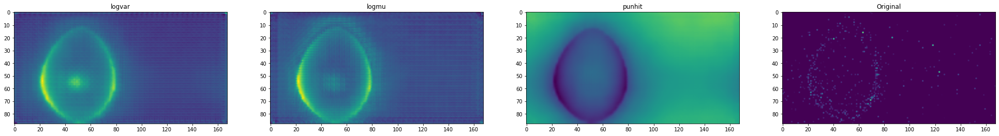

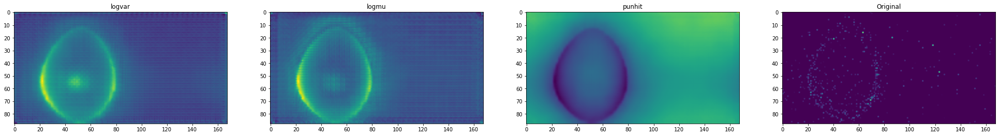

In [80]:
scan_loss(data[0],label[0],label_id[0])# 0.1799

# -20% to 20% of the true energy in 100 steps---scan of the loss around the minimum


##  low energy:160.30 ,  #index 32640

In [81]:
data[1]

array([   0.        ,    1.        ,    0.        ,  152.09716797,
       -154.30335999, -159.25753784,   -0.38014928,    0.20424426,
          0.90209246,  160.30194092])

In [82]:
lowerbound=data[1][9]*(0.8) # origE*0.8
upperbound=data[1][9]*(1.2) # origE*1.2
upperbound,lowerbound

(192.3623291015625, 128.241552734375)

In [83]:
step_size=(upperbound-lowerbound)/100
step_size

0.6412077636718749

In [84]:
lowerbound=data[1][9]*(0.8) # origE*0.8
upperbound=data[1][9]*(1.2) #
step_size=(upperbound-lowerbound)/100
energyList=[]
for i in range(100+1):
    E=lowerbound
    E=E+step_size*i
    energyList.append(E)  

In [85]:
energyList

[128.241552734375,
 128.88276049804688,
 129.52396826171875,
 130.16517602539062,
 130.8063837890625,
 131.44759155273437,
 132.08879931640627,
 132.73000708007814,
 133.37121484375,
 134.01242260742188,
 134.65363037109375,
 135.29483813476563,
 135.9360458984375,
 136.57725366210937,
 137.21846142578124,
 137.85966918945314,
 138.50087695312502,
 139.1420847167969,
 139.78329248046876,
 140.42450024414063,
 141.0657080078125,
 141.70691577148438,
 142.34812353515625,
 142.98933129882812,
 143.6305390625,
 144.27174682617186,
 144.91295458984376,
 145.55416235351564,
 146.1953701171875,
 146.83657788085938,
 147.47778564453125,
 148.11899340820312,
 148.760201171875,
 149.40140893554687,
 150.04261669921874,
 150.68382446289064,
 151.3250322265625,
 151.96623999023439,
 152.60744775390626,
 153.24865551757813,
 153.88986328125,
 154.53107104492187,
 155.17227880859375,
 155.81348657226562,
 156.45469433593752,
 157.0959020996094,
 157.73710986328126,
 158.37831762695313,
 159.01952539

### output the min_loss and reconstructed images(second row) with min_energy value,
### compared to the true events(first row)

0 --Energy:  128.24155 --loss:  0.27835608
1 --Energy:  128.88277 --loss:  0.27829444
2 --Energy:  129.52397 --loss:  0.27823436
3 --Energy:  130.16518 --loss:  0.2781756
4 --Energy:  130.80638 --loss:  0.27811885
5 --Energy:  131.44759 --loss:  0.278064
6 --Energy:  132.0888 --loss:  0.27801102
7 --Energy:  132.73001 --loss:  0.27795944
8 --Energy:  133.37122 --loss:  0.2779095
9 --Energy:  134.01242 --loss:  0.2778619
10 --Energy:  134.65363 --loss:  0.27781576
11 --Energy:  135.29485 --loss:  0.2777711
12 --Energy:  135.93605 --loss:  0.277728
13 --Energy:  136.57726 --loss:  0.27768725
14 --Energy:  137.21846 --loss:  0.27764803
15 --Energy:  137.85966 --loss:  0.2776103
16 --Energy:  138.50087 --loss:  0.27757424
17 --Energy:  139.14209 --loss:  0.2775399
18 --Energy:  139.7833 --loss:  0.27750766
19 --Energy:  140.4245 --loss:  0.2774772
20 --Energy:  141.0657 --loss:  0.27744845
21 --Energy:  141.70691 --loss:  0.27742177
22 --Energy:  142.34813 --loss:  0.2773993
23 --Energy:  

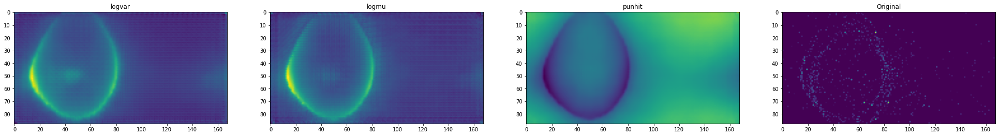

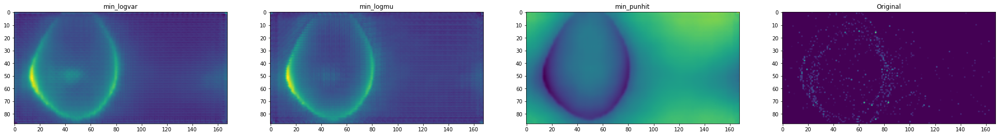

In [86]:
Loss, energy=min_scan_loss(data[1],label[1],label_id[1])

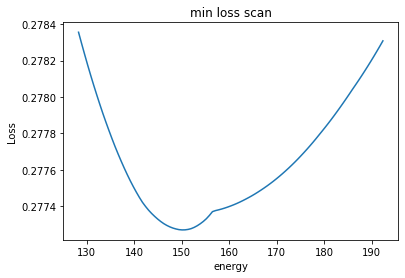

In [42]:
plt.plot(energy,Loss)
plt.xlabel("energy")
plt.ylabel("Loss")
plt.title('min loss scan')
plt.show()

## Mid Energy:   index #3968     E: [495.43713]

In [43]:
data[4]

array([ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,  5.25895042e+01,
       -1.32257690e+02, -2.08853363e+02, -9.63888049e-01,  1.93090271e-02,
        2.65606880e-01,  4.95437134e+02])

In [44]:
lowerbound=data[4][9]*(0.8) # origE*0.8
upperbound=data[4][9]*(1.2) # origE*1.2
step_size=(upperbound-lowerbound)/100
lowerbound,upperbound,step_size

(396.34970703125003, 594.524560546875, 1.9817485351562498)

In [45]:
energyList=[]
for i in range(100+1):
    E=lowerbound
    E=E+step_size*i
    energyList.append(E)  
energyList

[396.34970703125003,
 398.3314555664063,
 400.3132041015625,
 402.2949526367188,
 404.27670117187506,
 406.2584497070313,
 408.24019824218755,
 410.22194677734376,
 412.20369531250003,
 414.1854438476563,
 416.1671923828125,
 418.1489409179688,
 420.13068945312506,
 422.1124379882813,
 424.09418652343754,
 426.07593505859376,
 428.05768359375,
 430.0394321289063,
 432.0211806640625,
 434.0029291992188,
 435.98467773437505,
 437.96642626953127,
 439.94817480468754,
 441.92992333984375,
 443.911671875,
 445.8934204101563,
 447.8751689453125,
 449.8569174804688,
 451.83866601562505,
 453.82041455078127,
 455.80216308593754,
 457.7839116210938,
 459.76566015625,
 461.7474086914063,
 463.7291572265625,
 465.7109057617188,
 467.69265429687505,
 469.67440283203126,
 471.65615136718753,
 473.63789990234375,
 475.6196484375,
 477.6013969726563,
 479.58314550781256,
 481.5648940429688,
 483.54664257812505,
 485.52839111328126,
 487.51013964843753,
 489.4918881835938,
 491.47363671875,
 493.45538

0 --Energy:  396.3497 --loss:  0.46545786
1 --Energy:  398.33145 --loss:  0.4653663
2 --Energy:  400.3132 --loss:  0.4652782
3 --Energy:  402.29495 --loss:  0.46519297
4 --Energy:  404.2767 --loss:  0.46511102
5 --Energy:  406.25845 --loss:  0.46503234
6 --Energy:  408.2402 --loss:  0.46495652
7 --Energy:  410.22195 --loss:  0.46488523
8 --Energy:  412.2037 --loss:  0.4648174
9 --Energy:  414.18546 --loss:  0.46475315
10 --Energy:  416.1672 --loss:  0.46469218
11 --Energy:  418.14893 --loss:  0.4646343
12 --Energy:  420.13068 --loss:  0.46457946
13 --Energy:  422.11243 --loss:  0.46452802
14 --Energy:  424.09418 --loss:  0.46447927
15 --Energy:  426.07593 --loss:  0.4644344
16 --Energy:  428.05768 --loss:  0.46439296
17 --Energy:  430.03943 --loss:  0.46435452
18 --Energy:  432.02118 --loss:  0.46431935
19 --Energy:  434.00293 --loss:  0.46428704
20 --Energy:  435.98468 --loss:  0.46425754
21 --Energy:  437.96643 --loss:  0.46423084
22 --Energy:  439.94818 --loss:  0.4642073
23 --Energ

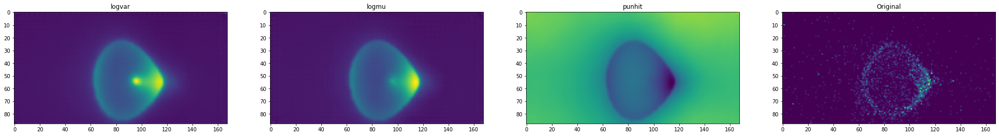

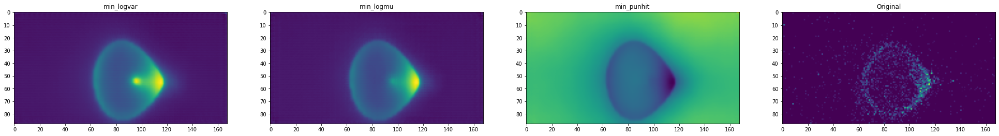

In [46]:
Loss, energy=min_scan_loss(data[4],label[4],label_id[4])

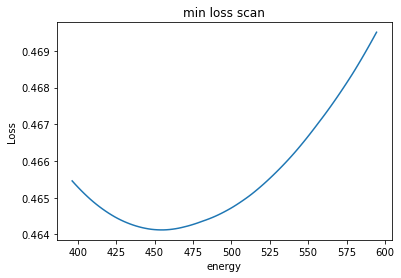

In [47]:
plt.plot(energy,Loss)
plt.xlabel("energy")
plt.ylabel("Loss")
plt.title('min loss scan')
plt.show()

## High Energy: index #5     E: [1839.6458]


In [48]:
lowerbound=data[12][9]*(0.8) # origE*0.8
upperbound=data[12][9]*(1.2) # origE*1.2
step_size=(upperbound-lowerbound)/100
lowerbound,upperbound,step_size,data[12][9]

(1471.7166015625, 2207.5749023437497, 7.358583007812497, 1839.645751953125)

In [49]:
energyList=[]
for i in range(100+1):
    E=lowerbound
    E=E+step_size*i
    energyList.append(E) 

0 --Energy:  1471.7166 --loss:  1.1064754
1 --Energy:  1479.0752 --loss:  1.1058755
2 --Energy:  1486.4337 --loss:  1.1052408
3 --Energy:  1493.7924 --loss:  1.1045556
4 --Energy:  1501.1509 --loss:  1.1038527
5 --Energy:  1508.5095 --loss:  1.1032586
6 --Energy:  1515.868 --loss:  1.1026835
7 --Energy:  1523.2267 --loss:  1.1020488
8 --Energy:  1530.5852 --loss:  1.1014254
9 --Energy:  1537.9438 --loss:  1.100812
10 --Energy:  1545.3025 --loss:  1.1002123
11 --Energy:  1552.661 --loss:  1.099627
12 --Energy:  1560.0197 --loss:  1.0990584
13 --Energy:  1567.3782 --loss:  1.0984972
14 --Energy:  1574.7368 --loss:  1.0979471
15 --Energy:  1582.0953 --loss:  1.097404
16 --Energy:  1589.454 --loss:  1.0968857
17 --Energy:  1596.8125 --loss:  1.0963778
18 --Energy:  1604.1711 --loss:  1.0958831
19 --Energy:  1611.5297 --loss:  1.0954003
20 --Energy:  1618.8883 --loss:  1.0949249
21 --Energy:  1626.2468 --loss:  1.094485
22 --Energy:  1633.6055 --loss:  1.0940515
23 --Energy:  1640.964 --los

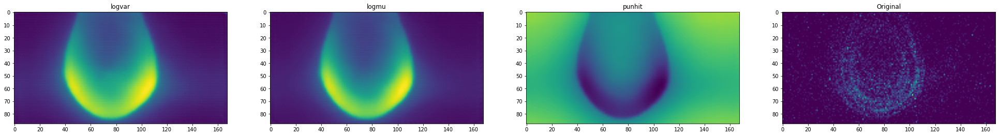

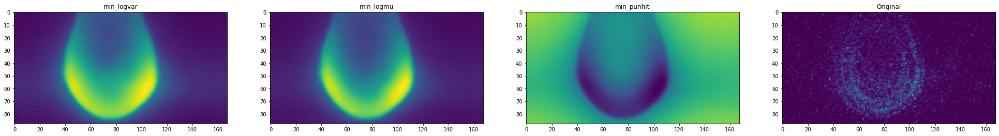

In [50]:
Loss, energy=min_scan_loss(data[12],label[12],label_id[12])

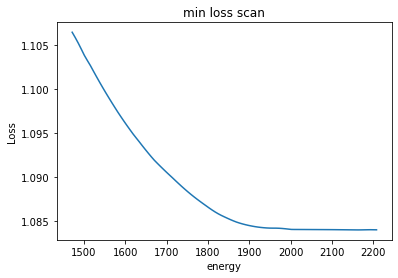

In [51]:
plt.plot(energy,Loss)
plt.xlabel("energy")
plt.ylabel("Loss")
plt.title('min loss scan')
plt.show()

## low energy:160.30

0 --Energy:  100.0 --loss:  0.28265268
1 --Energy:  101.0 --loss:  0.28245258
2 --Energy:  102.0 --loss:  0.28225607
3 --Energy:  103.0 --loss:  0.28206316
4 --Energy:  104.0 --loss:  0.28187317
5 --Energy:  105.0 --loss:  0.28168583
6 --Energy:  106.0 --loss:  0.28150213
7 --Energy:  107.0 --loss:  0.2813214
8 --Energy:  108.0 --loss:  0.28114456
9 --Energy:  109.0 --loss:  0.2809732
10 --Energy:  110.0 --loss:  0.28080428
11 --Energy:  111.0 --loss:  0.2806396
12 --Energy:  112.0 --loss:  0.2804784
13 --Energy:  113.0 --loss:  0.28032047
14 --Energy:  114.0 --loss:  0.28016552
15 --Energy:  115.0 --loss:  0.28001374
16 --Energy:  116.0 --loss:  0.27986556
17 --Energy:  117.0 --loss:  0.27972105
18 --Energy:  118.0 --loss:  0.2795803
19 --Energy:  119.0 --loss:  0.2794423
20 --Energy:  120.0 --loss:  0.27930778
21 --Energy:  121.0 --loss:  0.2791768
22 --Energy:  122.0 --loss:  0.27904928
23 --Energy:  123.0 --loss:  0.27892607
24 --Energy:  124.0 --loss:  0.27880722
25 --Energy:  125

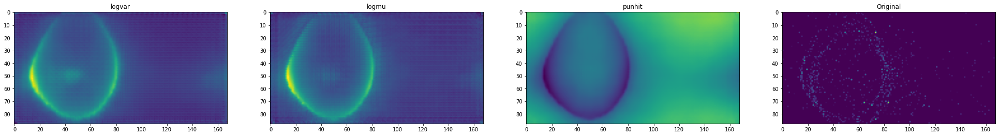

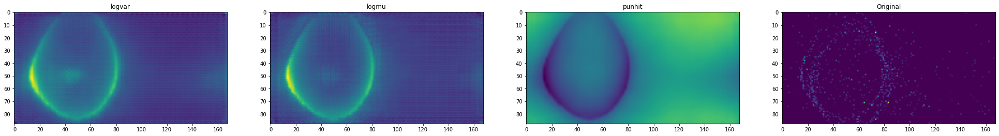

In [52]:
scan_loss(data[1],label[1],label_id[1]) #1.0038571

0 --Energy:  227.0 --loss:  0.34671924
1 --Energy:  228.0 --loss:  0.34667638
2 --Energy:  229.0 --loss:  0.34663498
3 --Energy:  230.0 --loss:  0.34659496
4 --Energy:  231.0 --loss:  0.346556
5 --Energy:  232.0 --loss:  0.3465185
6 --Energy:  233.0 --loss:  0.34648237
7 --Energy:  234.0 --loss:  0.3464476
8 --Energy:  235.0 --loss:  0.34641412
9 --Energy:  236.0 --loss:  0.34638187
10 --Energy:  237.0 --loss:  0.34635052
11 --Energy:  238.0 --loss:  0.34632036
12 --Energy:  239.0 --loss:  0.34629133
13 --Energy:  240.0 --loss:  0.34626344
14 --Energy:  241.0 --loss:  0.3462369
15 --Energy:  242.0 --loss:  0.34621087
16 --Energy:  243.0 --loss:  0.34618586
17 --Energy:  244.0 --loss:  0.34616193
18 --Energy:  245.0 --loss:  0.34613946
19 --Energy:  246.0 --loss:  0.34611842
20 --Energy:  247.0 --loss:  0.34609887
21 --Energy:  248.0 --loss:  0.34608096
22 --Energy:  249.0 --loss:  0.34606418
23 --Energy:  250.0 --loss:  0.34604862
24 --Energy:  251.0 --loss:  0.34603456
25 --Energy:  2

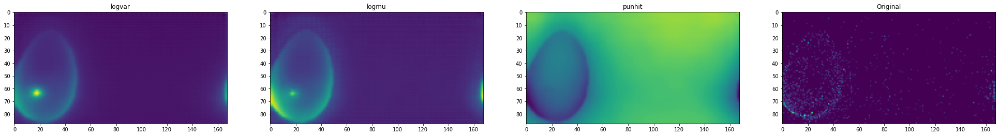

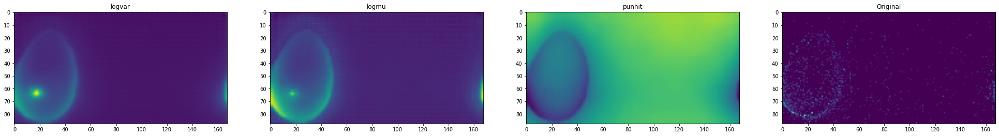

In [53]:
scan_loss(data[2],label[2],label_id[2])#loss:  0.9191403

0 --Energy:  202.0 --loss:  0.3057257
1 --Energy:  203.0 --loss:  0.30569744
2 --Energy:  204.0 --loss:  0.30567038
3 --Energy:  205.0 --loss:  0.30564463
4 --Energy:  206.0 --loss:  0.3056203
5 --Energy:  207.0 --loss:  0.30559725
6 --Energy:  208.0 --loss:  0.30557537
7 --Energy:  209.0 --loss:  0.30555454
8 --Energy:  210.0 --loss:  0.30553478
9 --Energy:  211.0 --loss:  0.3055163
10 --Energy:  212.0 --loss:  0.30549893
11 --Energy:  213.0 --loss:  0.3054825
12 --Energy:  214.0 --loss:  0.30546734
13 --Energy:  215.0 --loss:  0.30545366
14 --Energy:  216.0 --loss:  0.3054412
15 --Energy:  217.0 --loss:  0.30543002
16 --Energy:  218.0 --loss:  0.30542028
17 --Energy:  219.0 --loss:  0.305412
18 --Energy:  220.0 --loss:  0.30540505
19 --Energy:  221.0 --loss:  0.30539927
20 --Energy:  222.0 --loss:  0.30539447
21 --Energy:  223.0 --loss:  0.305391
22 --Energy:  224.0 --loss:  0.3053887
23 --Energy:  225.0 --loss:  0.30538756
24 --Energy:  226.0 --loss:  0.3053878
25 --Energy:  227.0 -

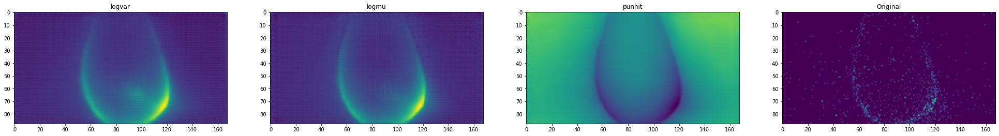

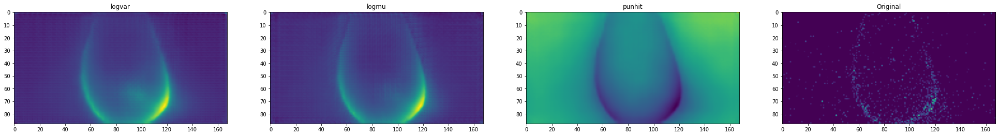

In [54]:
scan_loss(data[3],label[3],label_id[3]) #loss  1.0868729

0 --Energy:  435.0 --loss:  0.4642719
1 --Energy:  436.0 --loss:  0.46425724
2 --Energy:  437.0 --loss:  0.46424347
3 --Energy:  438.0 --loss:  0.46423042
4 --Energy:  439.0 --loss:  0.4642182
5 --Energy:  440.0 --loss:  0.4642067
6 --Energy:  441.0 --loss:  0.4641959
7 --Energy:  442.0 --loss:  0.4641857
8 --Energy:  443.0 --loss:  0.46417636
9 --Energy:  444.0 --loss:  0.46416777
10 --Energy:  445.0 --loss:  0.46415985
11 --Energy:  446.0 --loss:  0.46415251
12 --Energy:  447.0 --loss:  0.46414602
13 --Energy:  448.0 --loss:  0.46414042
14 --Energy:  449.0 --loss:  0.46413583
15 --Energy:  450.0 --loss:  0.46413213
16 --Energy:  451.0 --loss:  0.46412915
17 --Energy:  452.0 --loss:  0.4641266
18 --Energy:  453.0 --loss:  0.46412498
19 --Energy:  454.0 --loss:  0.4641238
20 --Energy:  455.0 --loss:  0.46412355
21 --Energy:  456.0 --loss:  0.46412438
22 --Energy:  457.0 --loss:  0.464126
23 --Energy:  458.0 --loss:  0.46412832
24 --Energy:  459.0 --loss:  0.46413147
25 --Energy:  460.0

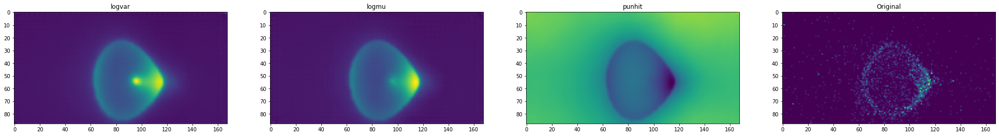

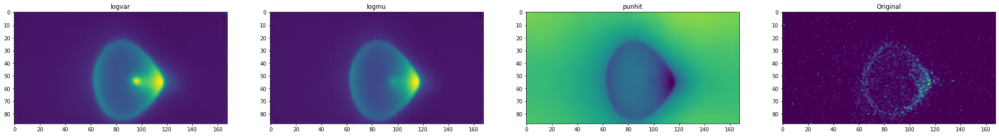

In [55]:
scan_loss(data[4],label[4],label_id[4])

0 --Energy:  372.0 --loss:  0.372507
1 --Energy:  373.0 --loss:  0.37248373
2 --Energy:  374.0 --loss:  0.37246168
3 --Energy:  375.0 --loss:  0.3724407
4 --Energy:  376.0 --loss:  0.37242067
5 --Energy:  377.0 --loss:  0.37240162
6 --Energy:  378.0 --loss:  0.37238368
7 --Energy:  379.0 --loss:  0.37236688
8 --Energy:  380.0 --loss:  0.3723514
9 --Energy:  381.0 --loss:  0.3723367
10 --Energy:  382.0 --loss:  0.3723228
11 --Energy:  383.0 --loss:  0.37230977
12 --Energy:  384.0 --loss:  0.37229797
13 --Energy:  385.0 --loss:  0.3722875
14 --Energy:  386.0 --loss:  0.37227768
15 --Energy:  387.0 --loss:  0.37226892
16 --Energy:  388.0 --loss:  0.3722614
17 --Energy:  389.0 --loss:  0.3722544
18 --Energy:  390.0 --loss:  0.37224808
19 --Energy:  391.0 --loss:  0.372243
20 --Energy:  392.0 --loss:  0.37223896
21 --Energy:  393.0 --loss:  0.37223595
22 --Energy:  394.0 --loss:  0.37223378
23 --Energy:  395.0 --loss:  0.37223253
24 --Energy:  396.0 --loss:  0.37223214
25 --Energy:  397.0 -

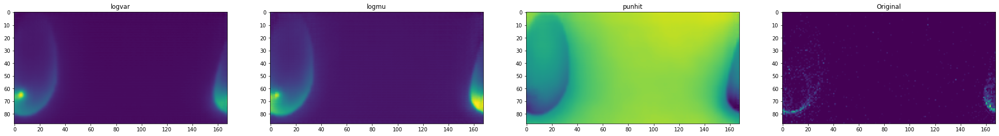

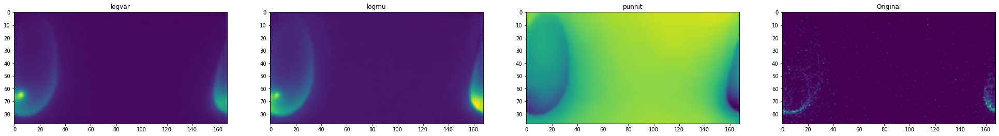

In [56]:
scan_loss(data[5],label[5],label_id[5])

0 --Energy:  347.0 --loss:  0.46099037
1 --Energy:  348.0 --loss:  0.4609422
2 --Energy:  349.0 --loss:  0.46089482
3 --Energy:  350.0 --loss:  0.46084815
4 --Energy:  351.0 --loss:  0.46080226
5 --Energy:  352.0 --loss:  0.46075684
6 --Energy:  353.0 --loss:  0.4607123
7 --Energy:  354.0 --loss:  0.46066898
8 --Energy:  355.0 --loss:  0.4606266
9 --Energy:  356.0 --loss:  0.46058512
10 --Energy:  357.0 --loss:  0.4605444
11 --Energy:  358.0 --loss:  0.4605046
12 --Energy:  359.0 --loss:  0.46046638
13 --Energy:  360.0 --loss:  0.4604289
14 --Energy:  361.0 --loss:  0.46039218
15 --Energy:  362.0 --loss:  0.46035612
16 --Energy:  363.0 --loss:  0.46032083
17 --Energy:  364.0 --loss:  0.46028614
18 --Energy:  365.0 --loss:  0.46025234
19 --Energy:  366.0 --loss:  0.46021873
20 --Energy:  367.0 --loss:  0.46018595
21 --Energy:  368.0 --loss:  0.46015406
22 --Energy:  369.0 --loss:  0.46012306
23 --Energy:  370.0 --loss:  0.46009302
24 --Energy:  371.0 --loss:  0.46006322
25 --Energy:  37

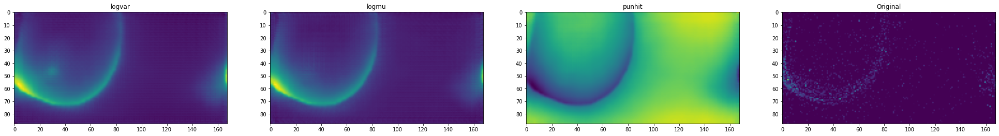

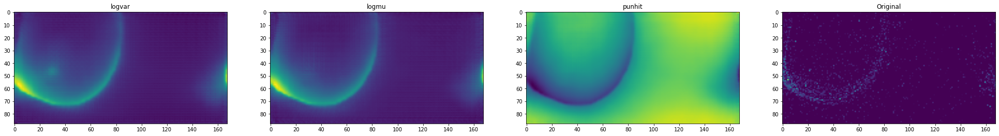

In [57]:
scan_loss(data[6],label[6],label_id[6])   

0 --Energy:  807.0 --loss:  0.650369
1 --Energy:  808.0 --loss:  0.65035814
2 --Energy:  809.0 --loss:  0.65034777
3 --Energy:  810.0 --loss:  0.6503381
4 --Energy:  811.0 --loss:  0.6503291
5 --Energy:  812.0 --loss:  0.65032065
6 --Energy:  813.0 --loss:  0.65031266
7 --Energy:  814.0 --loss:  0.65030485
8 --Energy:  815.0 --loss:  0.6502974
9 --Energy:  816.0 --loss:  0.6502895
10 --Energy:  817.0 --loss:  0.65028214
11 --Energy:  818.0 --loss:  0.6502751
12 --Energy:  819.0 --loss:  0.65026873
13 --Energy:  820.0 --loss:  0.65026283
14 --Energy:  821.0 --loss:  0.6502574
15 --Energy:  822.0 --loss:  0.65025234
16 --Energy:  823.0 --loss:  0.6502476
17 --Energy:  824.0 --loss:  0.6502434
18 --Energy:  825.0 --loss:  0.6502396
19 --Energy:  826.0 --loss:  0.6502363
20 --Energy:  827.0 --loss:  0.6502335
21 --Energy:  828.0 --loss:  0.6502312
22 --Energy:  829.0 --loss:  0.65023106
23 --Energy:  830.0 --loss:  0.65023226
24 --Energy:  831.0 --loss:  0.65023375
25 --Energy:  832.0 --lo

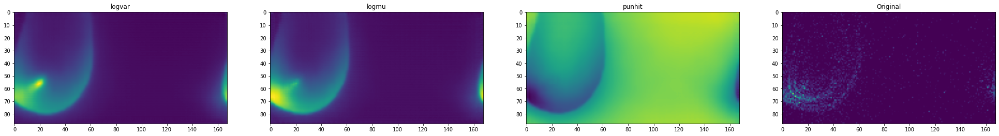

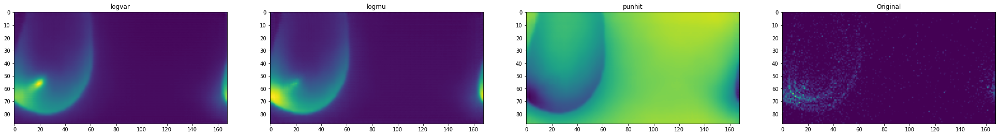

In [58]:
scan_loss(data[7],label[7],label_id[7])

0 --Energy:  776.0 --loss:  0.70001405
1 --Energy:  777.0 --loss:  0.7000068
2 --Energy:  778.0 --loss:  0.6999997
3 --Energy:  779.0 --loss:  0.69999295
4 --Energy:  780.0 --loss:  0.69998664
5 --Energy:  781.0 --loss:  0.6999807
6 --Energy:  782.0 --loss:  0.69997543
7 --Energy:  783.0 --loss:  0.6999704
8 --Energy:  784.0 --loss:  0.6999659
9 --Energy:  785.0 --loss:  0.6999617
10 --Energy:  786.0 --loss:  0.6999579
11 --Energy:  787.0 --loss:  0.69995445
12 --Energy:  788.0 --loss:  0.6999515
13 --Energy:  789.0 --loss:  0.69994897
14 --Energy:  790.0 --loss:  0.69994694
15 --Energy:  791.0 --loss:  0.69994533
16 --Energy:  792.0 --loss:  0.69994444
17 --Energy:  793.0 --loss:  0.69994384
18 --Energy:  794.0 --loss:  0.6999436
19 --Energy:  795.0 --loss:  0.69994366
20 --Energy:  796.0 --loss:  0.69994396
21 --Energy:  797.0 --loss:  0.69994473
22 --Energy:  798.0 --loss:  0.6999458
23 --Energy:  799.0 --loss:  0.6999472
24 --Energy:  800.0 --loss:  0.69994885
25 --Energy:  801.0 -

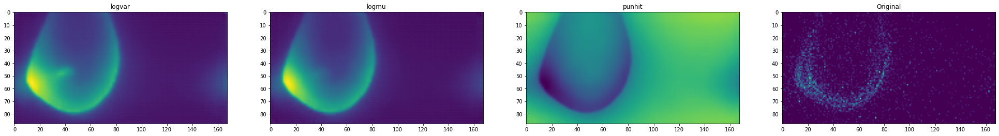

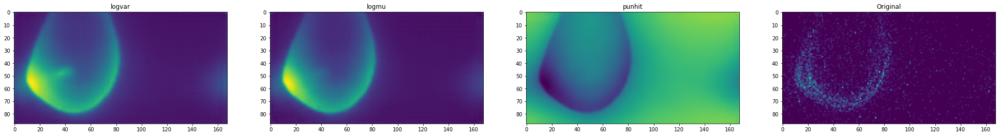

In [59]:
scan_loss(data[8],label[8],label_id[8])

0 --Energy:  748.0 --loss:  0.68701977
1 --Energy:  749.0 --loss:  0.68700045
2 --Energy:  750.0 --loss:  0.6869814
3 --Energy:  751.0 --loss:  0.6869628
4 --Energy:  752.0 --loss:  0.68694437
5 --Energy:  753.0 --loss:  0.6869264
6 --Energy:  754.0 --loss:  0.6869089
7 --Energy:  755.0 --loss:  0.68689203
8 --Energy:  756.0 --loss:  0.6868756
9 --Energy:  757.0 --loss:  0.6868595
10 --Energy:  758.0 --loss:  0.68684375
11 --Energy:  759.0 --loss:  0.6868283
12 --Energy:  760.0 --loss:  0.6868126
13 --Energy:  761.0 --loss:  0.68679756
14 --Energy:  762.0 --loss:  0.68678313
15 --Energy:  763.0 --loss:  0.686769
16 --Energy:  764.0 --loss:  0.6867552
17 --Energy:  765.0 --loss:  0.68674177
18 --Energy:  766.0 --loss:  0.68672884
19 --Energy:  767.0 --loss:  0.68671703
20 --Energy:  768.0 --loss:  0.6867066
21 --Energy:  769.0 --loss:  0.6866966
22 --Energy:  770.0 --loss:  0.6866871
23 --Energy:  771.0 --loss:  0.686678
24 --Energy:  772.0 --loss:  0.6866692
25 --Energy:  773.0 --loss:

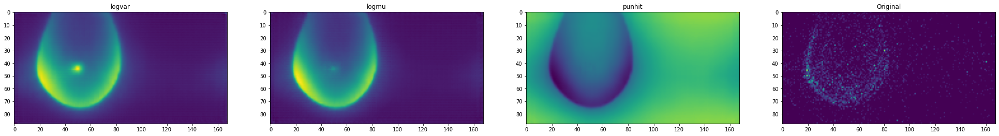

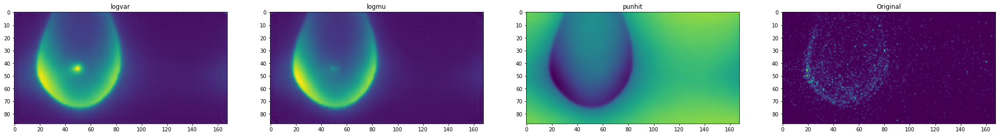

In [60]:
scan_loss(data[9],label[9],label_id[9])

0 --Energy:  784.0 --loss:  0.72781396
1 --Energy:  785.0 --loss:  0.7277872
2 --Energy:  786.0 --loss:  0.72776073
3 --Energy:  787.0 --loss:  0.72773474
4 --Energy:  788.0 --loss:  0.7277092
5 --Energy:  789.0 --loss:  0.727684
6 --Energy:  790.0 --loss:  0.7276594
7 --Energy:  791.0 --loss:  0.72763515
8 --Energy:  792.0 --loss:  0.7276117
9 --Energy:  793.0 --loss:  0.7275887
10 --Energy:  794.0 --loss:  0.7275662
11 --Energy:  795.0 --loss:  0.72754365
12 --Energy:  796.0 --loss:  0.72752166
13 --Energy:  797.0 --loss:  0.7275
14 --Energy:  798.0 --loss:  0.7274788
15 --Energy:  799.0 --loss:  0.72745824
16 --Energy:  800.0 --loss:  0.72743845
17 --Energy:  801.0 --loss:  0.7274191
18 --Energy:  802.0 --loss:  0.7274001
19 --Energy:  803.0 --loss:  0.7273815
20 --Energy:  804.0 --loss:  0.72736335
21 --Energy:  805.0 --loss:  0.72734565
22 --Energy:  806.0 --loss:  0.7273284
23 --Energy:  807.0 --loss:  0.72731155
24 --Energy:  808.0 --loss:  0.72729504
25 --Energy:  809.0 --loss:

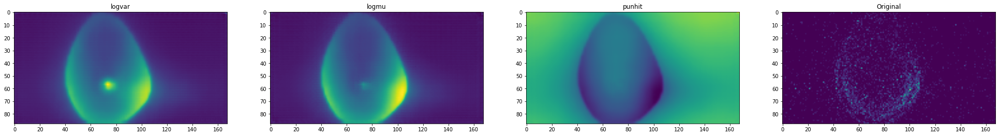

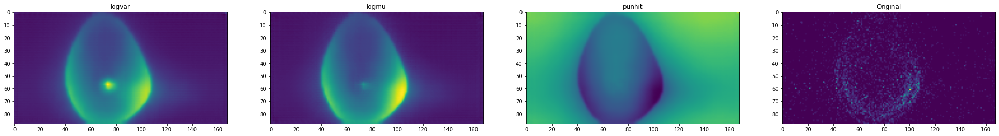

In [61]:
scan_loss(data[10],label[10],label_id[10])

0 --Energy:  630.0 --loss:  0.6052181
1 --Energy:  631.0 --loss:  0.6052119
2 --Energy:  632.0 --loss:  0.6052061
3 --Energy:  633.0 --loss:  0.6052007
4 --Energy:  634.0 --loss:  0.6051957
5 --Energy:  635.0 --loss:  0.60519123
6 --Energy:  636.0 --loss:  0.60518706
7 --Energy:  637.0 --loss:  0.6051833
8 --Energy:  638.0 --loss:  0.60517997
9 --Energy:  639.0 --loss:  0.6051768
10 --Energy:  640.0 --loss:  0.6051741
11 --Energy:  641.0 --loss:  0.60517186
12 --Energy:  642.0 --loss:  0.60516995
13 --Energy:  643.0 --loss:  0.6051683
14 --Energy:  644.0 --loss:  0.60516703
15 --Energy:  645.0 --loss:  0.6051662
16 --Energy:  646.0 --loss:  0.6051658
17 --Energy:  647.0 --loss:  0.6051657
18 --Energy:  648.0 --loss:  0.60516614
19 --Energy:  649.0 --loss:  0.60516685
20 --Energy:  650.0 --loss:  0.6051681
21 --Energy:  651.0 --loss:  0.60516965
22 --Energy:  652.0 --loss:  0.6051712
23 --Energy:  653.0 --loss:  0.60517323
24 --Energy:  654.0 --loss:  0.60517573
25 --Energy:  655.0 --lo

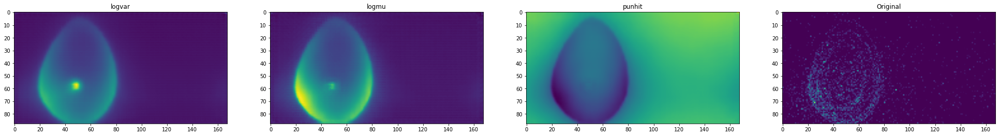

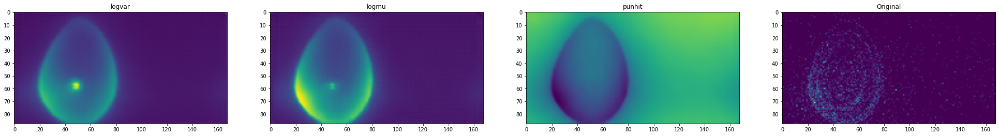

In [62]:
scan_loss(data[11],label[11],label_id[11])

0 --Energy:  1779.0 --loss:  1.087328
1 --Energy:  1780.0 --loss:  1.0872931
2 --Energy:  1781.0 --loss:  1.0872581
3 --Energy:  1782.0 --loss:  1.087223
4 --Energy:  1783.0 --loss:  1.0871882
5 --Energy:  1784.0 --loss:  1.0871537
6 --Energy:  1785.0 --loss:  1.0871193
7 --Energy:  1786.0 --loss:  1.0870852
8 --Energy:  1787.0 --loss:  1.0870512
9 --Energy:  1788.0 --loss:  1.0870173
10 --Energy:  1789.0 --loss:  1.086983
11 --Energy:  1790.0 --loss:  1.086949
12 --Energy:  1791.0 --loss:  1.0869151
13 --Energy:  1792.0 --loss:  1.0868814
14 --Energy:  1793.0 --loss:  1.086848
15 --Energy:  1794.0 --loss:  1.0868149
16 --Energy:  1795.0 --loss:  1.0867817
17 --Energy:  1796.0 --loss:  1.0867479
18 --Energy:  1797.0 --loss:  1.0867139
19 --Energy:  1798.0 --loss:  1.0866799
20 --Energy:  1799.0 --loss:  1.0866461
21 --Energy:  1800.0 --loss:  1.0866125
22 --Energy:  1801.0 --loss:  1.0865791
23 --Energy:  1802.0 --loss:  1.0865457
24 --Energy:  1803.0 --loss:  1.0865128
25 --Energy:  1

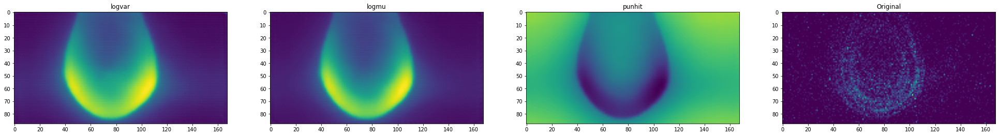

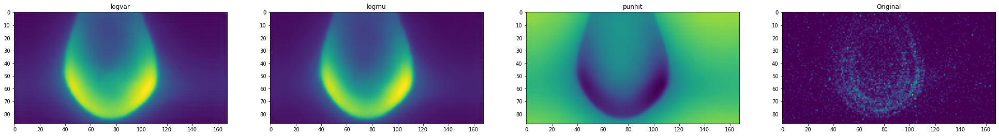

In [63]:
scan_loss(data[12],label[12],label_id[12])

0 --Energy:  1561.0 --loss:  0.9194637
1 --Energy:  1562.0 --loss:  0.91945183
2 --Energy:  1563.0 --loss:  0.91944003
3 --Energy:  1564.0 --loss:  0.91942865
4 --Energy:  1565.0 --loss:  0.91941714
5 --Energy:  1566.0 --loss:  0.91940594
6 --Energy:  1567.0 --loss:  0.91939497
7 --Energy:  1568.0 --loss:  0.91938436
8 --Energy:  1569.0 --loss:  0.91937375
9 --Energy:  1570.0 --loss:  0.91936326
10 --Energy:  1571.0 --loss:  0.919353
11 --Energy:  1572.0 --loss:  0.9193429
12 --Energy:  1573.0 --loss:  0.91933304
13 --Energy:  1574.0 --loss:  0.91932356
14 --Energy:  1575.0 --loss:  0.91931415
15 --Energy:  1576.0 --loss:  0.9193047
16 --Energy:  1577.0 --loss:  0.91929567
17 --Energy:  1578.0 --loss:  0.91928685
18 --Energy:  1579.0 --loss:  0.91927826
19 --Energy:  1580.0 --loss:  0.91927004
20 --Energy:  1581.0 --loss:  0.919262
21 --Energy:  1582.0 --loss:  0.91925424
22 --Energy:  1583.0 --loss:  0.9192465
23 --Energy:  1584.0 --loss:  0.9192391
24 --Energy:  1585.0 --loss:  0.919

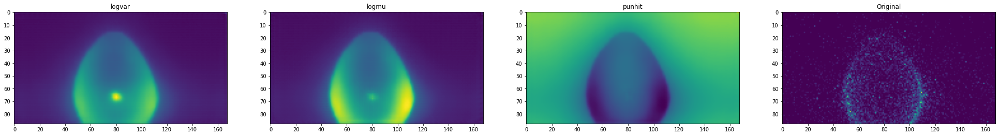

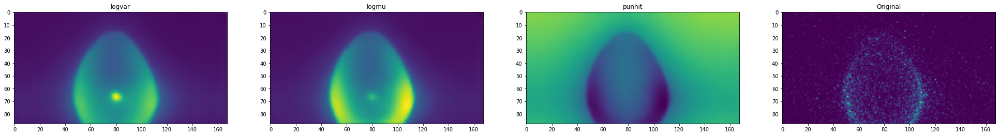

In [64]:
scan_loss(data[13],label[13],label_id[13])

0 --Energy:  1818.0 --loss:  1.0876621
1 --Energy:  1819.0 --loss:  1.0876421
2 --Energy:  1820.0 --loss:  1.0876222
3 --Energy:  1821.0 --loss:  1.0876025
4 --Energy:  1822.0 --loss:  1.087583
5 --Energy:  1823.0 --loss:  1.0875636
6 --Energy:  1824.0 --loss:  1.0875446
7 --Energy:  1825.0 --loss:  1.0875256
8 --Energy:  1826.0 --loss:  1.0875069
9 --Energy:  1827.0 --loss:  1.0874883
10 --Energy:  1828.0 --loss:  1.0874712
11 --Energy:  1829.0 --loss:  1.0874552
12 --Energy:  1830.0 --loss:  1.0874392
13 --Energy:  1831.0 --loss:  1.0874233
14 --Energy:  1832.0 --loss:  1.0874076
15 --Energy:  1833.0 --loss:  1.0873919
16 --Energy:  1834.0 --loss:  1.0873764
17 --Energy:  1835.0 --loss:  1.0873611
18 --Energy:  1836.0 --loss:  1.0873457
19 --Energy:  1837.0 --loss:  1.0873307
20 --Energy:  1838.0 --loss:  1.0873158
21 --Energy:  1839.0 --loss:  1.0873009
22 --Energy:  1840.0 --loss:  1.0872864
23 --Energy:  1841.0 --loss:  1.0872719
24 --Energy:  1842.0 --loss:  1.0872576
25 --Energy

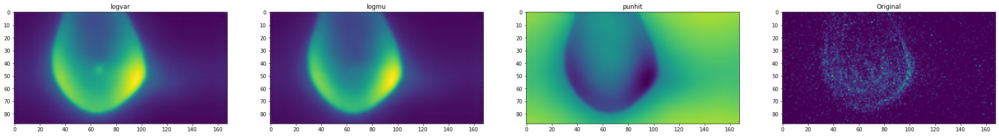

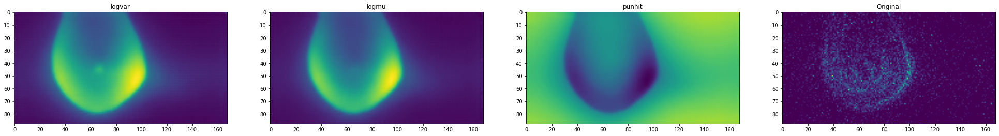

In [28]:
scan_loss(data[14],label[14],label_id[14])  #loss over 1 ???

0 --Energy:  1431.0 --loss:  0.92517674
1 --Energy:  1432.0 --loss:  0.92511106
2 --Energy:  1433.0 --loss:  0.92504567
3 --Energy:  1434.0 --loss:  0.9249811
4 --Energy:  1435.0 --loss:  0.9249172
5 --Energy:  1436.0 --loss:  0.92485344
6 --Energy:  1437.0 --loss:  0.92479014
7 --Energy:  1438.0 --loss:  0.9247271
8 --Energy:  1439.0 --loss:  0.924664
9 --Energy:  1440.0 --loss:  0.9246013
10 --Energy:  1441.0 --loss:  0.92453885
11 --Energy:  1442.0 --loss:  0.9244766
12 --Energy:  1443.0 --loss:  0.9244144
13 --Energy:  1444.0 --loss:  0.92435235
14 --Energy:  1445.0 --loss:  0.92428565
15 --Energy:  1446.0 --loss:  0.9242178
16 --Energy:  1447.0 --loss:  0.9241503
17 --Energy:  1448.0 --loss:  0.9240832
18 --Energy:  1449.0 --loss:  0.92401636
19 --Energy:  1450.0 --loss:  0.92394996
20 --Energy:  1451.0 --loss:  0.9238838
21 --Energy:  1452.0 --loss:  0.9238179
22 --Energy:  1453.0 --loss:  0.9237525
23 --Energy:  1454.0 --loss:  0.92368734
24 --Energy:  1455.0 --loss:  0.92362237

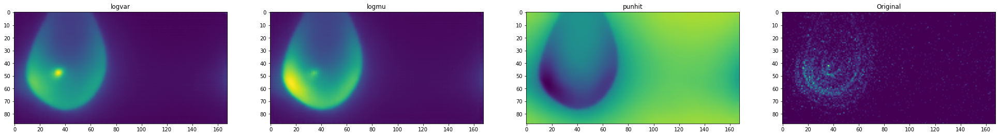

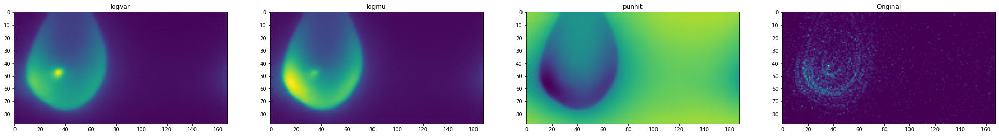

In [29]:
scan_loss(data[15],label[15],label_id[15])

0 --Energy:  1293.0 --loss:  0.8886917
1 --Energy:  1294.0 --loss:  0.8886376
2 --Energy:  1295.0 --loss:  0.8885836
3 --Energy:  1296.0 --loss:  0.8885301
4 --Energy:  1297.0 --loss:  0.8884765
5 --Energy:  1298.0 --loss:  0.88842314
6 --Energy:  1299.0 --loss:  0.8883701
7 --Energy:  1300.0 --loss:  0.8883175
8 --Energy:  1301.0 --loss:  0.8882651
9 --Energy:  1302.0 --loss:  0.88821286
10 --Energy:  1303.0 --loss:  0.8881609
11 --Energy:  1304.0 --loss:  0.888109
12 --Energy:  1305.0 --loss:  0.88805735
13 --Energy:  1306.0 --loss:  0.8880059
14 --Energy:  1307.0 --loss:  0.88795465
15 --Energy:  1308.0 --loss:  0.88790333
16 --Energy:  1309.0 --loss:  0.8878523
17 --Energy:  1310.0 --loss:  0.88780147
18 --Energy:  1311.0 --loss:  0.8877507
19 --Energy:  1312.0 --loss:  0.8877006
20 --Energy:  1313.0 --loss:  0.887651
21 --Energy:  1314.0 --loss:  0.88760173
22 --Energy:  1315.0 --loss:  0.88755256
23 --Energy:  1316.0 --loss:  0.8874983
24 --Energy:  1317.0 --loss:  0.88744134
25 

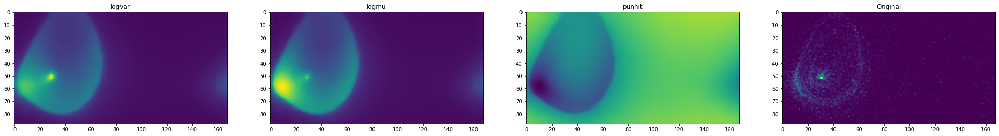

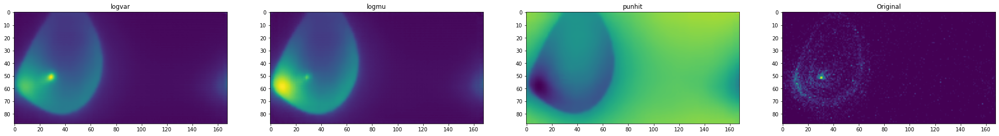

In [30]:
scan_loss(data[16],label[16],label_id[16])

0 --Energy:  1218.0 --loss:  0.90045327
1 --Energy:  1219.0 --loss:  0.90044755
2 --Energy:  1220.0 --loss:  0.90044206
3 --Energy:  1221.0 --loss:  0.9004368
4 --Energy:  1222.0 --loss:  0.90043193
5 --Energy:  1223.0 --loss:  0.9004274
6 --Energy:  1224.0 --loss:  0.900423
7 --Energy:  1225.0 --loss:  0.90041894
8 --Energy:  1226.0 --loss:  0.900415
9 --Energy:  1227.0 --loss:  0.9004113
10 --Energy:  1228.0 --loss:  0.900408
11 --Energy:  1229.0 --loss:  0.9004051
12 --Energy:  1230.0 --loss:  0.90040255
13 --Energy:  1231.0 --loss:  0.9004002
14 --Energy:  1232.0 --loss:  0.900398
15 --Energy:  1233.0 --loss:  0.90039593
16 --Energy:  1234.0 --loss:  0.90039414
17 --Energy:  1235.0 --loss:  0.9003927
18 --Energy:  1236.0 --loss:  0.90039164
19 --Energy:  1237.0 --loss:  0.9003907
20 --Energy:  1238.0 --loss:  0.90039
21 --Energy:  1239.0 --loss:  0.90039104
22 --Energy:  1240.0 --loss:  0.9003926
23 --Energy:  1241.0 --loss:  0.9003942
24 --Energy:  1242.0 --loss:  0.9003961
25 --E

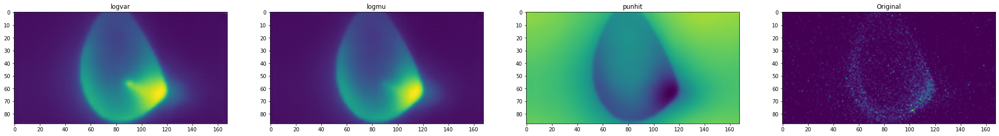

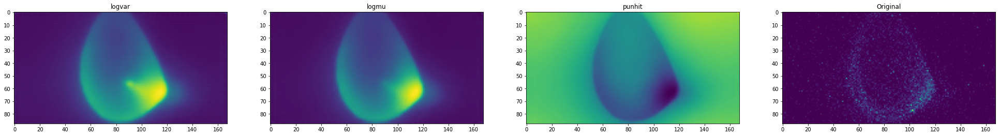

In [31]:
scan_loss(data[17],label[17],label_id[17])